<a href="https://colab.research.google.com/github/gabola24/purchase-card-transactions-DStest/blob/main/Globant_Purcharse_Card_Transactions_Cluster_fv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The main goal of this analysis is to explore patterns, and find consumer/councils activity segments in order to support the creation of new strategies and practices inside the Code of Recommended Practice for Local Authorities on Data Transparency.**

## Presented by Gabriel Maldonado


*Sweetviz for an easy EDA and pycaret for fast iterations.*

In [ ]:
!pip install pycaret

In [ ]:
!pip install sweetviz

     |████████████████████████████████| 15.1MB 139kB/s 


In [ ]:
!pip install umap-learn

In [ ]:
!pip install scikit-fuzzy

     |████████████████████████████████| 1.0MB 31.6MB/s 
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-cp37-none-any.whl size=894088 sha256=e154020412c53506952defdec66f18b49a5a987725d359f1611db8d39f92e16e
  Stored in directory: /root/.cache/pip/wheels/b9/4e/77/da79b16f64ef1738d95486e2731eea09d73e90a72465096600
Successfully built scikit-fuzzy


In [ ]:
import os
import pandas as pd
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import numpy as np
import matplotlib.pyplot as plt
import sweetviz as sv
import IPython
import seaborn as sns
from pycaret.anomaly import setup as anomaly_setup
from pycaret.anomaly import create_model as create_anomaly_model
from pycaret.anomaly import plot_model as plot_anomaly_model
from pycaret.clustering import setup as clustering_setup
from pycaret.clustering import create_model as create_clustering_model
from pycaret.clustering import plot_model as plot_clustering_model
import umap.umap_ as umap
import skfuzzy as fuzz
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

*I already have the files from 2016 and 2017 in a drive folder, and linked with the colab notebook*

In [ ]:
ls drive/MyDrive/Globant-test/2016 && ls drive/MyDrive/Globant-test/2017

publishing-spend-november-2016.xls  publish-spend-july-2016.xls
publish-spend-april-2016.xls        publish-spend-june-2016.xls
publish-spend-august-2016.xls       publishspendmarch2016.xls
publish-spend-december-2016.xls     publish-spend-may-2016.xls
publishspendfebruary2016.xls        publish-spend-october-2016.xls
publishspendjanuary2016.xls         publish-spend-september-2016.xls
cusersfinainmndesktoppublish-copy-january-2017.xls
cusersfinainmndesktoppublish-spend-april-2017.xls
cusersfinainmndesktoppublish-spend-august-2017-all-directorates.xls
cusersfinainmndesktoppublish-spend-february-2017-all-directorates.xls
cusersfinainmndesktoppublish-spend-july-2017.xls
cusersfinainmndesktoppublish-spend-june--2017.xls
cusersfinainmndesktoppublish-spend-march-2017.xls
cusersfinainmndesktoppublish-spend-may-2017.xls
cusersfinainmndesktoppublish-spend-november-2017-all-directorates.xls
cusersfinainmndesktoppublish-spend-october-2017-all-directorates.xls
cusersfinainmndesktoppublish-spend-s

*Lets read and concat these files and fix some typos in the features names*

In [ ]:
df_list = []
for file in os.listdir("drive/MyDrive/Globant-test/2016"):
    df = pd.read_excel("drive/MyDrive/Globant-test/2016/" + file)
    df_list.append(df.rename(columns = {"Directorates":"Directorate"}))
ds_16 = pd.concat(df_list, axis=0)

df_list = []
for file in os.listdir("drive/MyDrive/Globant-test/2017"):
    df = pd.read_excel("drive/MyDrive/Globant-test/2017/" + file).rename(columns = {"Directorates": "Directorate", "BILLING CUR CODE.1": "BILLING CUR CODE"})
    df = df[['TRANS DATE', 'TRANS VAT DESC', 'ORIGINAL GROSS AMT', 'MERCHANT NAME',
       'CARD NUMBER', 'TRANS CAC CODE 1', 'TRANS CAC DESC 1',
       'TRANS CAC CODE 2', 'TRANS CAC DESC 2', 'TRANS CAC CODE 3',
       'Directorate']]
    df_list.append(df)
ds_17 = pd.concat(df_list, axis=0)

In [ ]:
ds_16.head()

,TRANS DATE,TRANS VAT DESC,ORIGINAL GROSS AMT,MERCHANT NAME,CARD NUMBER,TRANS CAC CODE 1,TRANS CAC DESC 1,TRANS CAC CODE 2,TRANS CAC DESC 2,TRANS CAC CODE 3,Directorate
0,2016-01-07,VR,43.56,tex sussex sstn,************8738,K020,Vehicle Fuel,RV12T,"Shakti Elders Dce, 73 Conybere St, B12",A00,Adult & Communities
1,2016-01-14,VR,54.70,tex sussex sstn,************8738,K020,Vehicle Fuel,RV12T,"Shakti Elders Dce, 73 Conybere St, B12",A00,Adult & Communities
2,2016-01-28,VR,48.10,tex sussex sstn,************8738,K020,Vehicle Fuel,RV12T,"Shakti Elders Dce, 73 Conybere St, B12",A00,Adult & Communities
3,2016-01-11,VR,50.00,malthurst petroleu,************5804,K020,Vehicle Fuel,RVA12,Enablement Tyburn Rd,A00,Adult & Communities
4,2016-01-15,VR,50.90,malthurst petroleu,************5804,K020,Vehicle Fuel,RVA12,Enablement Tyburn Rd,A00,Adult & Communities


In [ ]:
ds_17.head()

,TRANS DATE,TRANS VAT DESC,ORIGINAL GROSS AMT,MERCHANT NAME,CARD NUMBER,TRANS CAC CODE 1,TRANS CAC DESC 1,TRANS CAC CODE 2,TRANS CAC DESC 2,TRANS CAC CODE 3,Directorate
0,2017-01-03,VR,72.61,shell kings 587,************5770,K020,Vehicle Fuel,RV12N,African-Caribbean DC,A00,Adult & Communities
1,2017-01-24,VR,85.51,shell fiveways 387,************1147,K020,Vehicle Fuel,RV1K2,Elders Group - Ladywood,A00,Adult & Communities
2,2017-02-01,VR,10.09,shell fiveways 387,************1147,K020,Vehicle Fuel,RV1K2,Elders Group - Ladywood,A00,Adult & Communities
3,2017-01-04,VR,20.00,mibsons service st,************5804,K020,Vehicle Fuel,RVA12,Enablement Tyburn Rd,A00,Adult & Communities
4,2017-01-05,VR,50.00,malthurst petroleu,************5804,K020,Vehicle Fuel,RVA12,Enablement Tyburn Rd,A00,Adult & Communities


In [ ]:
ds_16.info(),ds_17.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52455 entries, 0 to 3001
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   TRANS DATE          52454 non-null  datetime64[ns]
 1   TRANS VAT DESC      48954 non-null  object        
 2   ORIGINAL GROSS AMT  52454 non-null  float64       
 3   MERCHANT NAME       52454 non-null  object        
 4   CARD NUMBER         52454 non-null  object        
 5   TRANS CAC CODE 1    52425 non-null  object        
 6   TRANS CAC DESC 1    52425 non-null  object        
 7   TRANS CAC CODE 2    52370 non-null  object        
 8   TRANS CAC DESC 2    52370 non-null  object        
 9   TRANS CAC CODE 3    52351 non-null  object        
 10  Directorate         52455 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(9)
memory usage: 4.8+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 48589 entries, 0 to 5204
Data columns (tota

(None, None)


*There is some null data, we are gonna configure our pycaret pipeline to deal with that. For now lets do some feature enginnering*



*Different aspects of the problem could be relevant in this stage. For example, in  Birmingham the councils are elected every 4 years, and 2017 was a **pre-electoral** year, so we can explore relevant patterns asociated with this event.*

In [ ]:
ds_pre_electoral = pd.concat( [ds_16, ds_17], axis = 0)

In [ ]:
ds_pre_electoral['day'] = ds_pre_electoral['TRANS DATE'].dt.day
ds_pre_electoral['month'] = ds_pre_electoral['TRANS DATE'].dt.month
ds_pre_electoral['year'] = ds_pre_electoral['TRANS DATE'].dt.year

*There is a 32% increase in the mean of the purcharses between 2016 and 2017. Being 2017 a pre-electoral year.*

In [ ]:
ds_pre_electoral.groupby(['year']).mean().drop(columns = ["day", "month"]).drop(2015.0)

,ORIGINAL GROSS AMT
year,
2016.0,162.718916
2017.0,215.430592


*Between Aug. and Sept. there is a clear peak in the purcharses of the councils.*

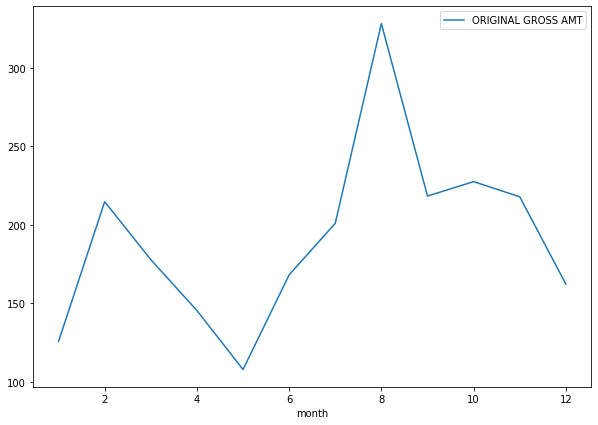

In [ ]:
ds_pre_electoral.groupby(['month']).mean().drop(columns = ["day", "year"]).plot(kind = "line", figsize = (10,7))

*Lets check for the mean of the purchase amount in each month*

In [ ]:
ds_pre_electoral.groupby(['year','month']).mean().drop(columns = "day").drop(2015.0)

ORIGINAL GROSS AMT
year   month                    
2016.0 1.0            150.534376
       2.0            164.627456
       3.0            150.258362
       4.0            104.826360
       5.0            167.670104
       6.0            159.941121
       7.0            179.845388
       8.0            276.183864
       9.0            153.023066
       10.0           152.069575
       11.0           167.057228
       12.0           162.763679
2017.0 1.0            102.478698
       2.0            274.337079
       3.0            202.325293
       4.0            197.191772
       5.0             57.335895
       6.0            176.637490
       7.0            221.975014
       8.0            383.025671
       9.0            296.360673
       10.0           301.907441
       11.0           265.999363
       12.0            28.776667

***In 2017 the purcharses average amount in August increase 38% compared to the last year***


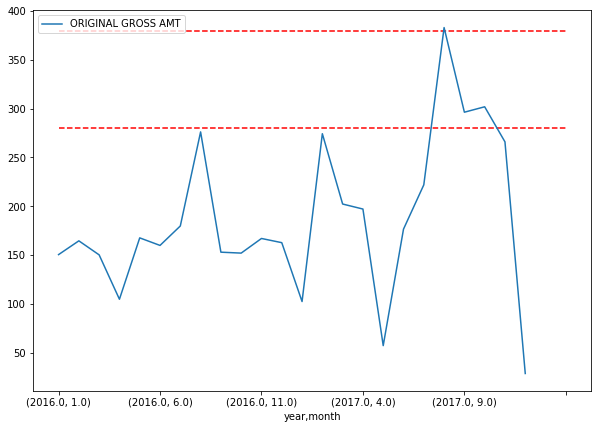

In [ ]:
ds_pre_electoral.groupby(['year','month']).mean().drop(columns = "day").drop(2015.0).plot(figsize = (10,7))
plt.hlines(280,0,25,'r','--')
plt.hlines(380,0,25,'r','--')

**There is certain differences in the behavior of the councils in the 2017, before the second half the year they purcharse more in travels sites.**

In [ ]:
ds_pre_electoral.drop(columns = "TRANS DATE").groupby(['year','month']).agg(lambda x:x.value_counts().index[0]).drop(2015.0)

TRANS VAT DESC  ORIGINAL GROSS AMT          MERCHANT NAME  \
year   month                                                             
2016.0 1.0               VZ               10.00  amazon uk marketplace   
       2.0               VR               20.00  amazon uk marketplace   
       3.0               VR               20.00  amazon uk marketplace   
       4.0               VR               10.00     travelodge website   
       5.0               VR               15.00  amazon uk marketplace   
       6.0               VR               50.00  amazon uk marketplace   
       7.0               VR               50.00  amazon uk marketplace   
       8.0               VR                3.00     travelodge website   
       9.0               VR               15.00  amazon uk marketplace   
       10.0              VZ               15.00  amazon uk marketplace   
       11.0              VZ                3.00  amazon uk marketplace   
       12.0              VZ               10.00  amazon uk marketplace   
2017.0 1.0               VZ               15.00  amazon uk marketplace   
       2.0               VZ                7.94  amazon uk marketplace   
       3.0               VZ               15.00  amazon uk marketplace   
       4.0               VR               50.00      travelodge gb0000   
       5.0               VZ               10.00  amazon uk marketplace   
       6.0               VR               15.00      travelodge gb0000   
       7.0               VR               10.00      travelodge gb0000   
       8.0               VR               15.00      travelodge gb0000   
       9.0               VR               15.00      travelodge gb0000   
       10.0              VR               15.00      travelodge gb0000   
       11.0              VZ               15.00      travelodge gb0000   
       12.0              VZ                7.38       cash advance fee   

                   CARD NUMBER TRANS CAC CODE 1     TRANS CAC DESC 1  \
year   month                                                           
2016.0 1.0    ************6034             L100    Equip Operational   
       2.0    ************6308             L100    Equip Operational   
       3.0    ************7710             L100    Equip Operational   
       4.0    ************6308             L100    Equip Operational   
       5.0    ************6720             L100    Equip Operational   
       6.0    ************6720             L100    Equip Operational   
       7.0    ************6308             L100    Equip Operational   
       8.0    ************6308             N060  Other Third Parties   
       9.0    ************6720             L100    Equip Operational   
       10.0   ************7710             L100    Equip Operational   
       11.0   ************6308             L100    Equip Operational   
       12.0   ************8053             L100    Equip Operational   
2017.0 1.0    ************0276             L100    Equip Operational   
       2.0    ************2604             L100    Equip Operational   
       3.0    ************6308             L100    Equip Operational   
       4.0    ************6316             L100    Equip Operational   
       5.0    ************6308             L100    Equip Operational   
       6.0    ************6308             L100    Equip Operational   
       7.0    ************6308             L100    Equip Operational   
       8.0    ************6308             N060  Other Third Parties   
       9.0    ************6308             L100    Equip Operational   
       10.0   ************6308             L100    Equip Operational   
       11.0   ************6720             L100    Equip Operational   
       12.0   ************6451             L540    Bank & Goro ChgsS   

             TRANS CAC CODE 2                        TRANS CAC DESC 2  \
year   month                                                            
2016.0 1.0              RUF0F  Illegal Money Lending T Stds Comm Inv.

## *We have two features with text description, MERCHANT NAME and TRANS CAC DESC 2. Lets extract info from this descriptions based on relevants keywords.*

In [ ]:
ds_total = pd.concat([ds_16, ds_17], axis=0)

In [ ]:
ds_total['MERCHANT NAME'].value_counts()

amazon uk marketplace        11319
travelodge gb0000             4890
travelodge website            3984
amazon uk retail              3634
asda home shopping            1846
                             ...  
ansty golf centre ltd no2        1
www.cim.co.uk                    1
overnightprints                  1
david austin rose                1
parkeon ltd                      1
Name: MERCHANT NAME, Length: 10062, dtype: int64

In [ ]:
ds_total['MERCHANT NAME'] = ds_total['MERCHANT NAME'].astype(str)

In [ ]:
ds_token = " ".join(ds_total['MERCHANT NAME'].values)

In [ ]:
aW=[]
# Removing Stop Words
import re 
processed_article =np.array([ds_token])
for j in range(processed_article.shape[0]):  
    processed_article[j] = re.sub("'S", ' ', processed_article[j])  
    processed_article[j] = re.sub('[^a-zA-Z]', ' ', processed_article[j])    
    processed_article[j] = re.sub(r'\s+', ' ', processed_article[j])
    # Preparing the dataset
    all_sentences = nltk.sent_tokenize(processed_article[j],'english')
    all_words = [nltk.word_tokenize(sent, 'english') for sent in all_sentences]
    #print(all_words)
    for i in range(len(all_words)):
      
        all_words[i] = [w.lower() for w in all_words[i] if w not in stopwords.words('english')]
        all_words[i] = [word.lower() for word in all_words[i] if re.match('^[a-zA-Z]+', word)]
        all_words[i] = [str(w) for w in all_words[i] if w not in ['y','a','www','co','\n','uk','eu','f','b','c','g','e','p','m','d','j','i','n','s','k','s','mm','ar','ol','av',"w"]]

    aW.append(all_words[0])

(-0.5, 1199.5, 599.5, -0.5)

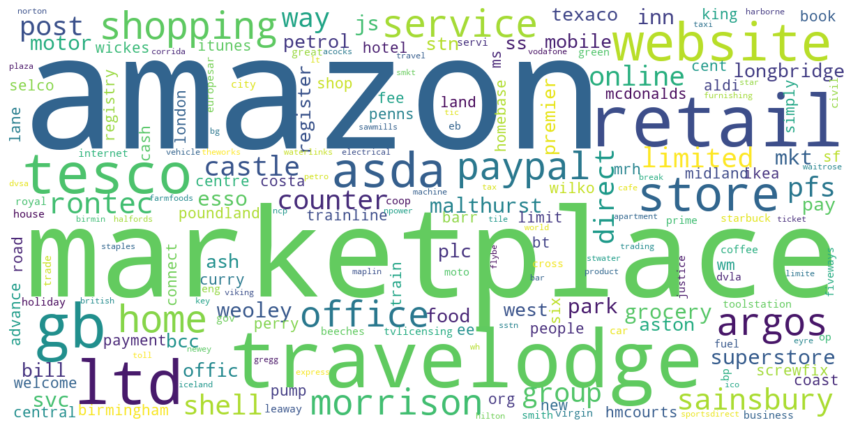

In [ ]:
wordcloud = WordCloud(collocations=False, background_color="white", scale = 3).generate(" ".join(aW[0]))
plt.figure(figsize=(15,14))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

*Lets create 50 categories of Merchants for analysis purposes.*

In [ ]:
merchant_groups = pd.Series(aW[0]).replace("mktplce","marketplace").value_counts()[:50].keys()

In [ ]:
new_merchant_name = []
for original_merchant in ds_total['MERCHANT NAME']:
    p =  None
    for merchant in merchant_groups:    
        if merchant in original_merchant:
            p = merchant
    if p == None:
        new_merchant_name.append("other")
    else: new_merchant_name.append(p)

In [ ]:
ds_total['MERCHANT NAME'] = new_merchant_name

In [ ]:
ds_total['MERCHANT NAME'].value_counts()[:50]

other          32132
marketplace    11321
retail          5995
gb              4984
website         3998
store           3549
ltd             3304
com             2882
way             1897
shopping        1863
paypal          1851
direct          1714
service         1517
amazon          1296
group           1258
sainsburys      1132
counter         1106
pfs             1069
superstore       972
svcs             949
weoley           938
shell            884
limited          836
argos            826
motor            805
mobile           787
petrol           781
west             772
malthurst        730
grocery          726
longbridge       725
morrisons        707
park             706
bill             706
plc              657
premier          648
online           609
tesco            601
home             470
morrison         450
post             379
inn              377
office           362
esso             350
castle           151
asda             103
rontec            91
aston        

*The TRANS CAC DESC 1 & 2 feature has more uniform description. Lets define the most common descriptions as categories.*


In [ ]:
ds_copy = ds_total.copy()

In [ ]:
ds_total['TRANS CAC DESC 2'] =  ds_total['TRANS CAC DESC 2'].astype(str)

In [ ]:
trans_cac_groups = ds_total['TRANS CAC DESC 2'].value_counts()[ds_total['TRANS CAC DESC 2'].value_counts()>200].keys()

In [ ]:
new_trans_name = []
for original_trans in ds_total['TRANS CAC DESC 2']:
    p =  None
    for trans in trans_cac_groups:    
        if trans in original_trans:
            p = trans
    if p == None:
        new_trans_name.append("other")
    else: new_trans_name.append(p)

In [ ]:
ds_total['TRANS CAC DESC 2'] = new_trans_name
ds_total['TRANS CAC DESC 2'].value_counts()[:10]

other                                     28681
Homeless Private Sector Accom              7739
Illegal Money Lending T Stds Comm Inv.     6401
The City of Birmingham School              2713
Technical Unit                             1639
Camborne House HLDC                        1619
H/Less Temporary Accomdtn Team             1147
West Heath Primary                         1053
Bloomsbury                                 1001
Ward End Junior & Infant  (NC)              973
Name: TRANS CAC DESC 2, dtype: int64

In [ ]:
ds_total['TRANS CAC DESC 1'] =  ds_total['TRANS CAC DESC 1'].astype(str)

In [ ]:
trans_cac_groups1 = ds_total['TRANS CAC DESC 1'].value_counts()[ds_total['TRANS CAC DESC 1'].value_counts()>50].keys()

In [ ]:
new_trans_name = []
for original_trans in ds_total['TRANS CAC DESC 1']:
    p =  None
    for trans in trans_cac_groups1:    
        if trans in original_trans:
            p = trans
    if p == None:
        new_trans_name.append("other")
    else: new_trans_name.append(p)

In [ ]:
ds_total['TRANS CAC DESC 1'] = new_trans_name
ds_total['TRANS CAC DESC 1'].value_counts()[:10]

Equip Operational          20127
Vehicle Fuel               11128
Purchases Food             10277
Other Third Parties         8576
Supplies & Sev Mic          5773
Books                       4712
Mat'l Raw/Drct              3495
Conference Fees Subs UK     3197
Equip Other                 3064
Hospitality                 2551
Name: TRANS CAC DESC 1, dtype: int64

*The day and month of the purcharse may represent patterns between users/councils.*

In [ ]:
ds_total['day'] = ds_total['TRANS DATE'].dt.day
ds_total['month'] = ds_total['TRANS DATE'].dt.month

In [ ]:
df = ds_total.drop(columns= ["CARD NUMBER", "TRANS DATE", 'TRANS CAC CODE 1', 'TRANS CAC CODE 2'])

## ***EDA***

In [ ]:
df_string = df[['TRANS VAT DESC', 'MERCHANT NAME', 'TRANS CAC DESC 1','TRANS CAC DESC 2', 'TRANS CAC CODE 3', 'Directorate']].astype(str)
df_float = df['ORIGINAL GROSS AMT'].astype(float)
df_int = df[['day', 'month']].fillna(0).astype(int)
df_v1 = pd.concat([df_string, df_float, df_int], axis=1)

In [ ]:
df_v1.to_csv("drive/MyDrive/Globant-test/df_v1.csv",index= False)

In [ ]:
df_v1= pd.read_csv("drive/MyDrive/Globant-test/df_v1.csv")

In [ ]:
df_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101044 entries, 0 to 5204
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   TRANS VAT DESC      101044 non-null  object 
 1   MERCHANT NAME       101044 non-null  object 
 2   TRANS CAC DESC 1    101044 non-null  object 
 3   TRANS CAC DESC 2    101044 non-null  object 
 4   TRANS CAC CODE 3    101044 non-null  object 
 5   Directorate         101044 non-null  object 
 6   ORIGINAL GROSS AMT  101043 non-null  float64
 7   day                 101044 non-null  int64  
 8   month               101044 non-null  int64  
dtypes: float64(1), int64(2), object(6)
memory usage: 7.7+ MB


In [ ]:
EDA = sv.analyze(df_v1)
EDA.show_html('EDA.html', open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report EDA.html was generated.


*With the following report, we can assert the associations between features, and give an interactive visualization of the features in the data. This report generates categorical associations using uncertainty coefficient & correlation ratio(from 0 to 1)*


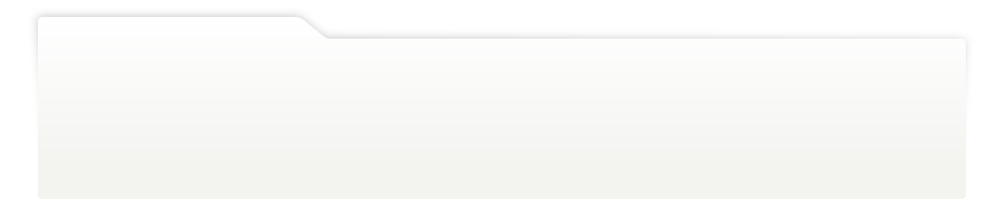
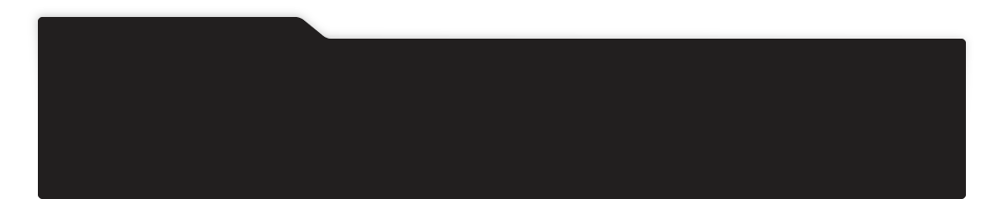
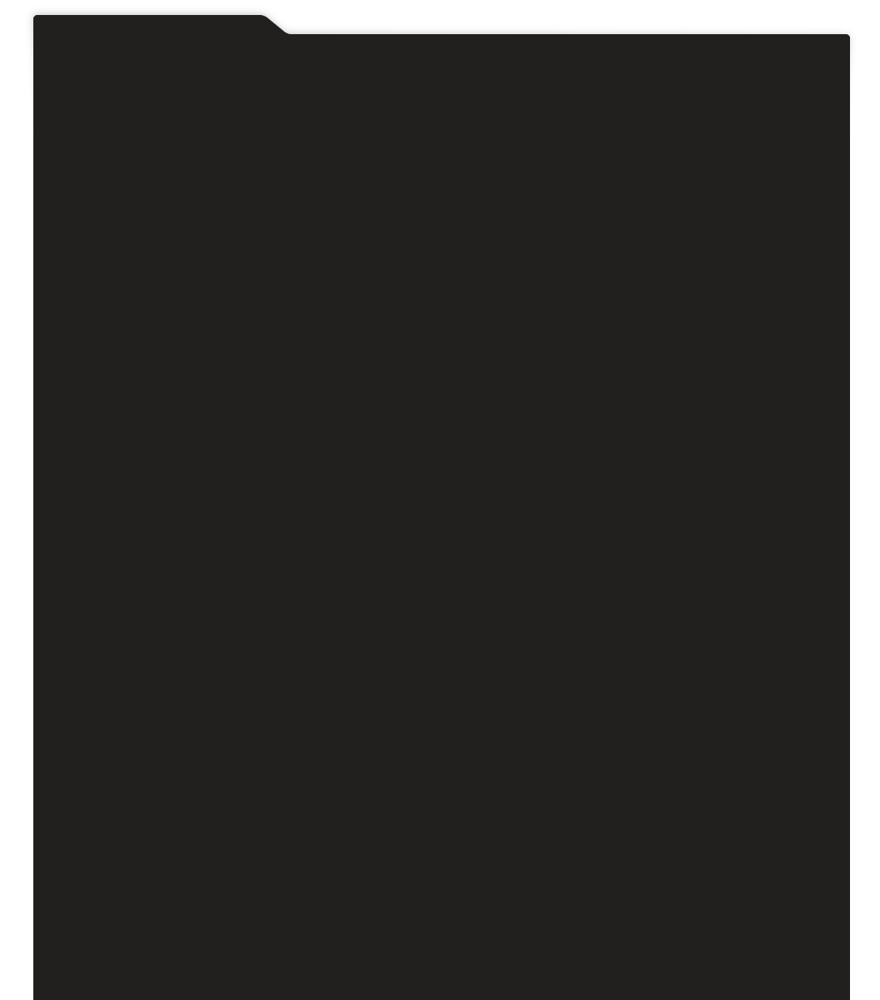
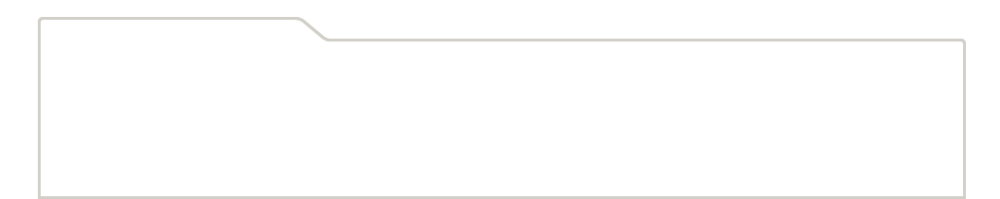
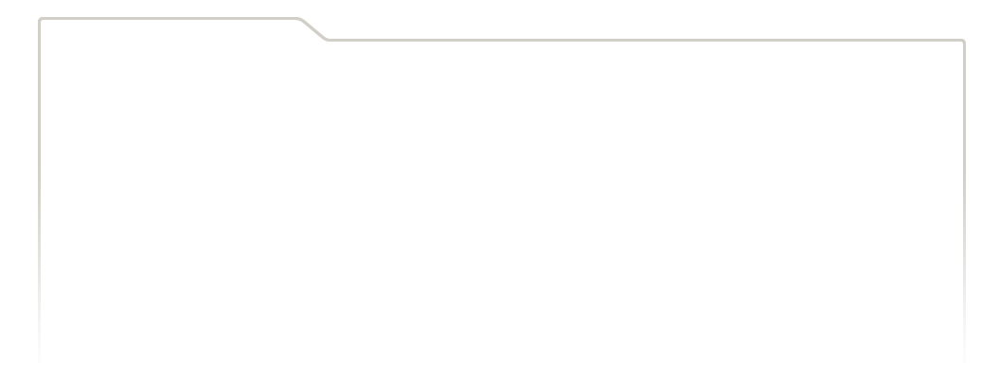
...
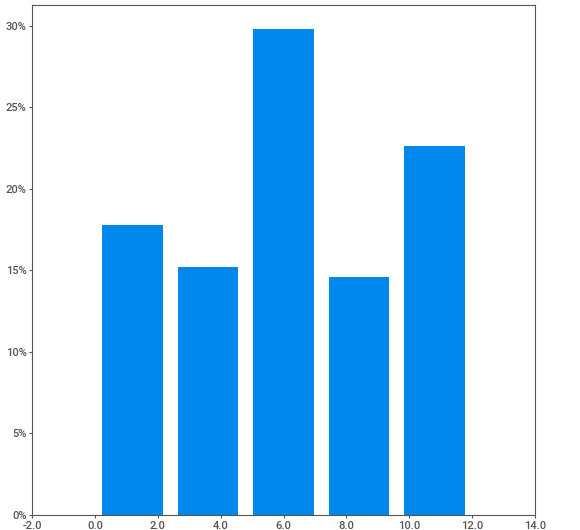
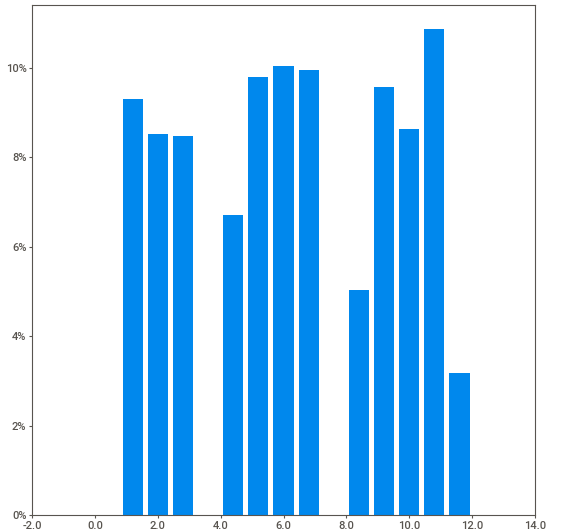
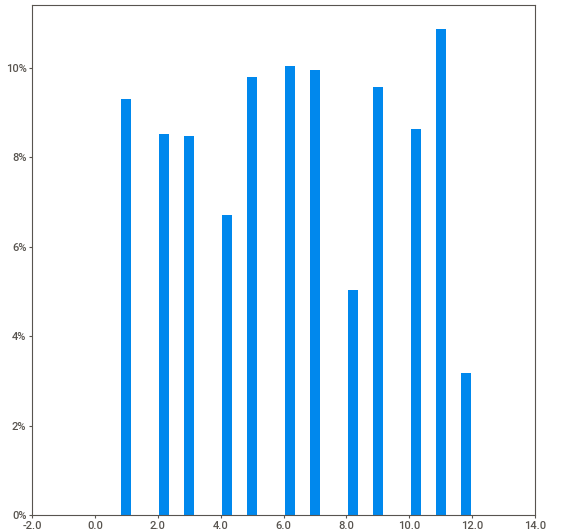
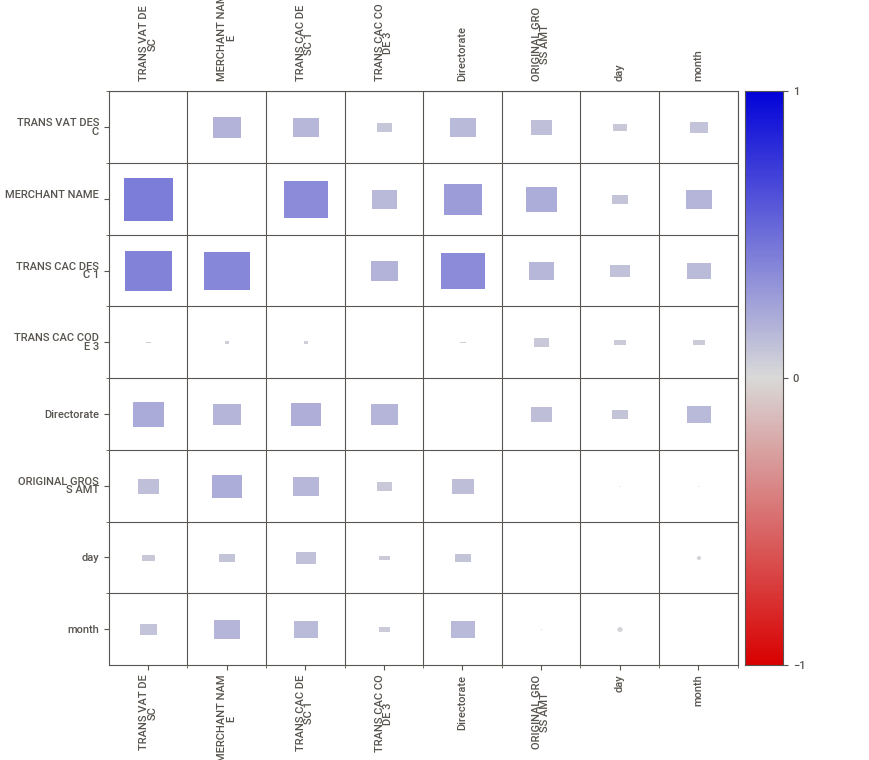
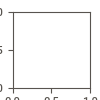

In [ ]:
IPython.display.HTML(filename='EDA.html')

The report are saved in a html file, located in the repository.

In [ ]:
EDA.get_what_influences_me('ORIGINAL GROSS AMT')

{'Directorate': 0.08554529661099754,
 'MERCHANT NAME': 0.16206575545813437,
 'TRANS CAC CODE 3': 0.03771631134801481,
 'TRANS CAC DESC 1': 0.11241133464389799,
 'TRANS VAT DESC': 0.07738855878194537,
 'day': 0.009316104619667054,
 'month': 0.01106809652179027}

# *Lets try some anomaly detection methods*

In [ ]:
ds = anomaly_setup(data = df_v1, numeric_features = ['day',"month",'ORIGINAL GROSS AMT' ] , categorical_features = ['TRANS VAT DESC', 'MERCHANT NAME', 'TRANS CAC DESC 1','TRANS CAC DESC 2', 'TRANS CAC CODE 3', 'Directorate'], preprocess= True,categorical_iterative_imputer= "lightgbm", normalize= True)

In [ ]:
local_outlier_factor = create_anomaly_model("lof")

In [ ]:
df_v2 = df_v1.copy()
df_v2["outlier"] = local_outlier_factor.labels_

In [ ]:
df_v2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101044 entries, 0 to 5204
Data columns (total 10 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   TRANS VAT DESC      101044 non-null  object 
 1   MERCHANT NAME       101044 non-null  object 
 2   TRANS CAC DESC 1    101044 non-null  object 
 3   TRANS CAC DESC 2    101044 non-null  object 
 4   TRANS CAC CODE 3    101044 non-null  object 
 5   Directorate         101044 non-null  object 
 6   ORIGINAL GROSS AMT  101043 non-null  float64
 7   day                 101044 non-null  int64  
 8   month               101044 non-null  int64  
 9   outlier             101044 non-null  int64  
dtypes: float64(1), int64(3), object(6)
memory usage: 8.5+ MB


*Lets visualize distribution of outliers*

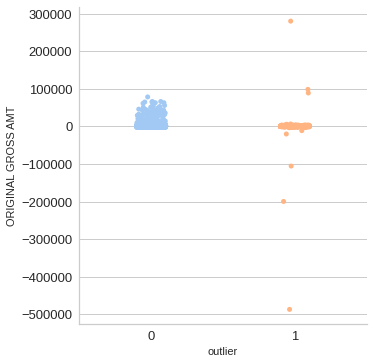

In [ ]:
np.seterr(under='ignore')
sns.catplot(x="outlier", y="ORIGINAL GROSS AMT", data=df_v2, palette="pastel")
plt.tick_params(axis='both', which='major', labelsize=13)


*The outliers has a greater standar deviation and variance in the "Original Gross Amt" feature. This approach can be a base line method if you want to detect suspicious activity in the purchases of councils.*

In [ ]:
df_v2.groupby("outlier").std().drop(columns = ["day", "month"])

,ORIGINAL GROSS AMT
outlier,
0,1248.611452
1,8735.809470


In [ ]:
df_v2.groupby("outlier").var().drop(columns = ["day", "month"])

,ORIGINAL GROSS AMT
outlier,
0,1.559031e+06
1,7.631437e+07


*We can explore the outlier representation in terms of Purchase amount by merchant and transaction type*

In [ ]:
df_v2.month = df_v2.month.replace(0,1)

In [ ]:
df_v2.groupby(["outlier","MERCHANT NAME"]).mean().drop(columns = ["day", "month"])['ORIGINAL GROSS AMT'][0].sort_values()

MERCHANT NAME
sainsburys       25.019105
amazon           27.742178
svcs             31.121343
marketplace      32.163238
superstore       42.092345
store            44.563356
home             44.599005
retail           47.815882
morrisons        50.376056
mobile           52.779173
petrol           53.826733
way              53.903234
tesco            57.044661
malthurst        57.070517
pfs              57.300602
weoley           57.886479
rontec           57.919231
motor            58.096203
longbridge       59.783073
shell            60.733242
shopping         61.272275
asda             61.486265
morrison         61.898902
counter          64.003008
paypal           65.727320
esso             65.945533
plc              70.741158
js               72.016000
grocery          76.127028
direct           85.866698
bill             91.345476
argos            96.281528
west            100.605879
ltd             101.473836
com             106.855328
other           121.611522
limited       

In [ ]:
df_v2.groupby(["outlier","MERCHANT NAME"]).mean().drop(columns = ["day", "month"])['ORIGINAL GROSS AMT'][1].sort_values()

MERCHANT NAME
direct        -7602.839732
shell            11.258182
malthurst        16.012857
morrison         17.749500
grocery          19.858333
superstore       21.115526
counter          22.053448
morrisons        22.701912
mobile           24.238462
bill             28.298529
west             29.349318
sainsburys       30.078125
amazon           32.692308
marketplace      32.981693
post             34.725357
petrol           35.257200
plc              38.989091
shopping         41.173810
svcs             42.001270
js               50.000000
tesco            51.167308
weoley           52.272000
pfs              52.466964
retail           53.025121
way              53.181899
park             54.012500
longbridge       55.568182
store            58.578571
office           71.107273
ltd              73.884937
premier          75.935000
com              78.862921
motor            88.246667
paypal           90.862679
travelodge       93.440000
limited          94.270877
argos         

## ***We can explore more especific patterns adquiring feedbacks from the domain experts, in this case an expert in corruption or the regulatory body.***

*Lets check the most common value in the different categorical features using group by methods in the outlier class and merchant name.*

In [ ]:
df_v2.replace("nan",np.nan).dropna().groupby(["outlier","MERCHANT NAME"]).agg(lambda x:x.value_counts().index[0])

TRANS VAT DESC         TRANS CAC DESC 1  ... day month
outlier MERCHANT NAME                                          ...          
0       amazon                    VZ        Equip Operational  ...  13    11
        argos                     VR        Equip Operational  ...   9    11
        asda                      VR             Vehicle Fuel  ...  21     1
        aston                     VR     N'Papers&Periodicals  ...  10    11
        bill                      VZ     Phon NonCentrx Lines  ...  17     3
...                              ...                      ...  ...  ..   ...
1       travelodge                VR      Other Third Parties  ...  10     9
        way                       VR             Vehicle Fuel  ...  19     2
        website                   VR              Hospitality  ...  30     1
        weoley                    VR             Vehicle Fuel  ...  15     4
        west                      VR  Conference Fees Subs UK  ...  21     9

[99 rows x 8 columns]

In [ ]:
df_v2.replace("nan",np.nan).dropna().groupby(["outlier","TRANS CAC DESC 1"]).mean().drop(columns = ["day", "month"])

ORIGINAL GROSS AMT
outlier TRANS CAC DESC 1                        
0       Advertising NonStaff          115.235517
        Aftercare Assistance          194.045184
        Bank & Goro ChgsS             189.932522
        Bldg RM Departmental           78.416721
        Bldg RM Fair Fund NS          163.498467
...                                          ...
1       Vehicle OthrunCosts            36.986667
        Vehicle R&M                   133.714333
        Visits Expenditure            219.845455
        Water Services                800.207941
        other                         151.746389

[117 rows x 1 columns]

## ***Lets use one unsupervised learning method to find some patterns in the data, and find consumer/councils activity segments: Kmeans***

In [ ]:
df_v3 = df_v2[df_v2.outlier==0].drop(columns = "outlier")

In [ ]:
df_v4 = df_v3.sample(20000)

### ***There is so many levels in some categorical features and this can make the experiment slow and introduces probable noise for certain machine learning algorithms, we are gonne build our pipeline specifing those features as "High cardinality features, this it will replace the original value of feature with the frequency distribution and convert the feature into numeric.***

*Also we configure or pipeline to made numerical imputation based in mean and categorical imputation based in a lightgbm categorical iterative imputer.*

In [ ]:
ds2 = clustering_setup(data = df_v4.replace("nan",np.nan) , numeric_features = ['day','ORIGINAL GROSS AMT' ] ,
                       categorical_features = ["month",'TRANS VAT DESC', 'MERCHANT NAME', 'TRANS CAC DESC 1','TRANS CAC DESC 2', 'TRANS CAC CODE 3', 'Directorate'],
                       high_cardinality_features = ['TRANS VAT DESC', 'MERCHANT NAME', 'TRANS CAC DESC 1','TRANS CAC DESC 2', 'TRANS CAC CODE 3', 'Directorate'],
                       preprocess= True,categorical_iterative_imputer= "lightgbm",
                       normalize= True)

,Description,Value
0,session_id,7794
1,Original Data,"(20000, 9)"
2,Missing Values,True
3,Numeric Features,2
4,Categorical Features,7
5,Ordinal Features,False
6,High Cardinality Features,True
7,High Cardinality Method,frequency
8,Transformed Data,"(20000, 20)"
9,CPU Jobs,-1


### *3 differents metrics: Silhouette, Calinsky-Harabasz and Davies-Boulding index and the elbow method to find the best number of cluster for our problem. In this case, Kmeans method suggest 6 clusters.*

In [ ]:
kmeans = create_model('kmeans', num_clusters=6)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1816,3151.1027,1.3534,0,0,0


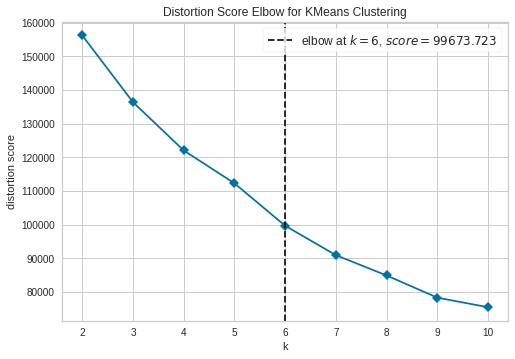

In [ ]:
plot_model(kmeans,'elbow')

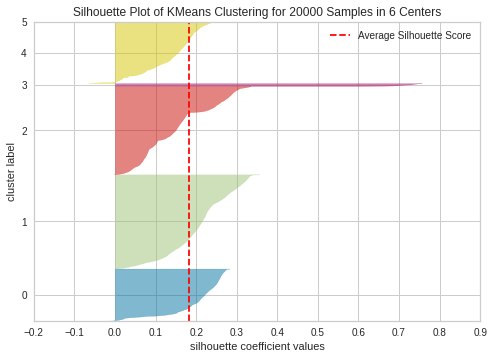

In [ ]:
plot_model(kmeans, 'silhouette')

***Based in the internal metrics, it could be suggested that there is no high compaction within the groups***

*Lets visualize the clusters distribution and generate interpretation* 

In [ ]:
plot_model(kmeans,'distribution',feature = 'ORIGINAL GROSS AMT')


***There is a slight separation between groups that represent a particular spending behavior. For example the cluster 5 groups expenses above 25k, and on the other hand cluster 0 and 3 shows common expenses that are below 5k.***

In [ ]:
plot_model(kmeans,'distribution',feature = 'TRANS VAT DESC')

*This variable TRANS VAT DESC contains 2 large representative categories (VZ and VR), within which clusters 1, 2 and 0 show a clear difference in the proportions of their observations. VR type transactions are more common to find in Cluster 1 and 4, while for VZ type they would tend to be in Cluster 2 and 0*

In [ ]:
plot_model(kmeans,'distribution',feature = 'Directorate',)

The clusters 0 and 2 shows relations in the Transaction Directorate, in this case the category CYP&F SCHOOLS is distributed in its majority in these two groups. Groups 1 and 4 are distributed more uniform in all categories and with greater intensity in "local services", "CYP & F" and "Corporate Resources"

In [ ]:
plot_model(kmeans,'distribution',feature = 'MERCHANT NAME')

*With respect to the merchant name variable, patterns can be observed in the distribution of the groupings found by the method. In certain categories there is a slight tendency to group types of purchases such as those generated on websites, and in gb stores. And on the other hand, groups that share normal consumer behaviors: amazon, marketplaces, retail, tesco. The general category "other" shows a strong tendence to form group of buyers from highly varied sources.*

## ***Conclusions***



## 1.   *The detection of outliers in this problem can be an approach that delivers a lot of value in the internal processes of the Code of Recommended Practice for Local Authorities on Data Transparency. The ability to interpret these outliers depends directly on the interpretation given to it. In the following iterations, a series of feedback would be proposed with the domain expert to guide the findings in terms of impact for the business problem.*
## *2.   The characterization of public spending can be carried out with the use of an unsupervised strategy. The understanding of the behavior of councils can be used by regulatory or supervisory bodies to create strategies for the detection of corruption and the elaboration of regulations that promote transparency in these positions*.



## *Questions in the process*



1. How do they detect unusual cases of purchases today?
2. There is certain merchants names that could be trigger event if this company is involved in corruption acitvities?
3. What is the most frequent type of corruption in this council?
4. What is the relevance in each one of the categories present in the transactions code and descriptions? 



#### ***Other experimentations***

*A dimension reduction process based on UMAP was carried out, in order to project this data in a space that will highlight the separation between segments and the compaction in them. Differents parametter configurations were tested.*

In [ ]:
mapper = umap.UMAP(set_op_mix_ratio=0.5,  n_neighbors=15, min_dist=0.25, n_components=10, random_state=42).fit(get_config("X"))

In [ ]:
embedding = mapper.embedding_

Text(0, 0.5, 'Component 2')

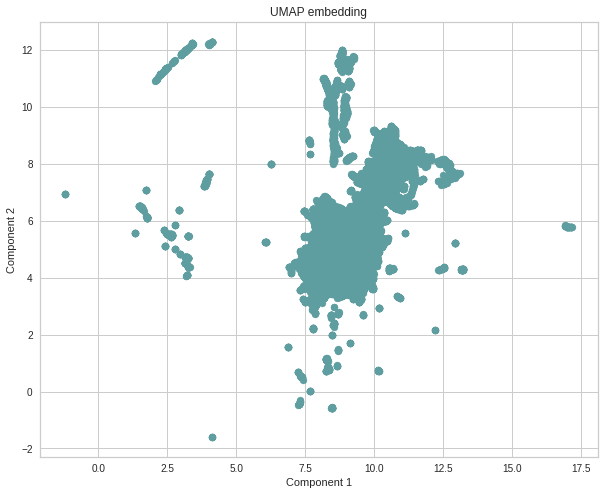

In [ ]:
plt.figure(figsize=(10,8))
plt.scatter(embedding[:, 0], embedding[:, 1],color = 'cadetblue')
plt.title('UMAP embedding')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
#plt.scatter(embedding[df_v2.outlier][:, 0], embedding[df_v2.outlier][:, 1],color = 'red')

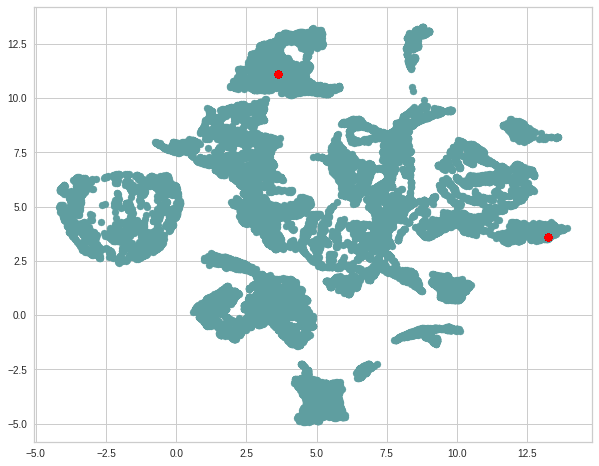

In [ ]:
plt.figure(figsize=(10,8))
plt.scatter(embedding2[:, 0], embedding2[:, 1],color = 'cadetblue')
plt.scatter(embedding2[one_class_svm.labels_][:, 0], embedding2[one_class_svm.labels_][:, 1],color = 'red')

*Fuzzy methods were experimented on these representations. This experimentation route was not prolonged any longer because clear results were not shown and to avoid over-extending the exercise*

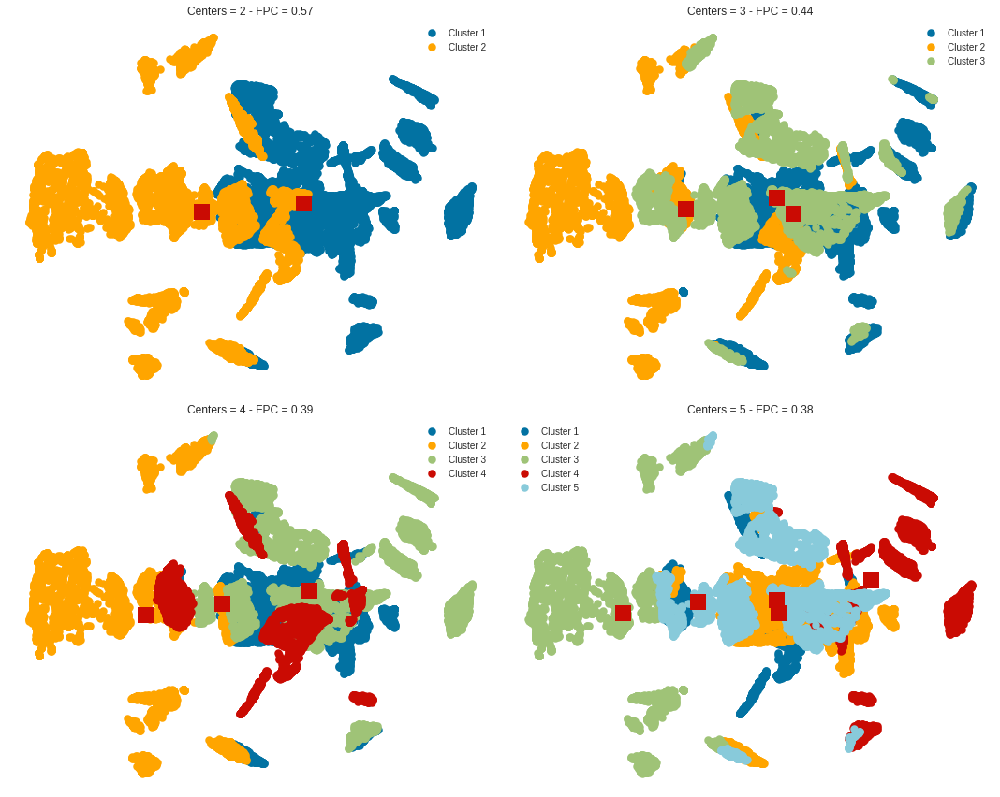

In [ ]:
colors = ['b', 'orange', 'g', 'r', 'c', 'm', 'y', 'k', 'Brown', 'ForestGreen']
fig1, axes1 = plt.subplots(2, 2, figsize=(15,12))
#alldata =  PCA(n_components=15).fit_transform(datos_sin_outilers2).T
fpcs = []
xpts = embedding2[:, 0].T
ypts = embedding2[:, 1].T
for ncenters, ax in enumerate(axes1.reshape(-1), 2):
    cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
        embedding2.T, ncenters, 2, error=0.0005, maxiter=1000, init=None)

    # Store fpc values for later
    fpcs.append(fpc)

    # Plot assigned clusters, for each data point in training set
    cluster_membership = np.argmax(u, axis=0)
    for j in range(ncenters):
        ax.plot(xpts[cluster_membership == j],
                ypts[cluster_membership == j], '.', color=colors[j], label = "Cluster " + str(j+1), markeredgewidth = 5.0 )

    # Mark the center of each fuzzy cluster
    for pt in cntr:
        ax.plot(pt[0], pt[1], 'rs', markeredgewidth = 10)

    ax.set_title('Centers = {0} - FPC = {1:.2f}'.format(ncenters, fpc))
    ax.axis('off')
    ax.legend()

fig1.tight_layout()

***In this report only results of K-Means Clustering are showed. However, other models were used in the development of the exercise :Spectral Clustering, Agglomerative Clustering, Density-Based Spatial Clustering***

### ***Different visualization approaches were experimented, and the analysis was extended in individual months, this approach can give a more gentle interpretation of the distribution of the groups.***

In [ ]:
plot_model(kmeans)

***Things to try in future iterations***



1.   Acquire more knowledge of the variables involved in the problem in a way that allows the creation of new characteristics that allow a better recognition of these patterns. **More feture enginnering**
2.   Create triggers based in external events like the presence of an ilegal Directorate or Merchant name.

